In [1]:
# Load python modules
from tensorflow.keras import datasets, layers, models, regularizers
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix
from tensorflow.keras.layers import Resizing, Rescaling
import seaborn as sns
import tensorflow_datasets as tfds
from sklearn.utils import shuffle 
import matplotlib.pyplot as plt
from datetime import datetime
import tensorflow as tf
from tqdm import tqdm  # Perform iterature with progress bar
import numpy as np
import PIL.Image
import PIL
import cv2
import os

In [2]:
#Class labelsb
class_names = ['Glass', 'Metal', 'Paper', 'Textile']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}
nb_classes = len(class_names)
IMAGE_SIZE = (64, 64)

In [3]:
print('Number of classes:', nb_classes)

Number of classes: 4


In [4]:
resize_layer_32 = tf.keras.Sequential([
    Resizing(32, 32),
])

In [5]:
# Path to Dataset1e

# Dataset with 4 classes - 270 images for training and 50 images for testing per class
train_ds_1 = 'C:/Mani/Dataset/dataset1/train_ds'
test_ds_1 = 'C:/Mani/Dataset/dataset1/test_ds'

# Dataset with 4 classes - 450 images for training with data augmentation images and 50 images for testing
train_ds_2 = 'C:/Mani/Dataset/dataset2/train_ds'
test_ds_2 = 'C:/Mani/Dataset/dataset2/test_ds'

# Dataset with 6 classes - 450 images for training with data augmentation images and 50 images for testing
train_ds_3 = 'C:/Mani/Dataset/dataset3/train_ds'
test_ds_3 = 'C:/Mani/Dataset/dataset3/test_ds'


In [6]:
# Load dataset 

def load_data(train_path, test_path):
    """
        Load the data from local folder
        
    """
    datasets = [train_path, test_path]  
    
    output = []
    
    # Iterate through training and test sets
    for dataset in datasets:
        
        #Empty Image and Labels list
        images = []
        labels = []
        
        print("Loading {}".format(dataset))
        
        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            label = class_names_label[folder]
            
            # Iterate through each image in our folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):
                
                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)
                
                # Open and resize the img
                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, IMAGE_SIZE) 
                
                # Append the image and its corresponding label to the output
                images.append(image)
                labels.append(label)
                
        images = np.array(images, dtype = 'float32')
        labels = np.array(labels, dtype = 'int32')   
        
        output.append((images, labels))

    return output

In [7]:
#Prepare dataset for training and testing
(train_images, train_labels), (test_images, test_labels) = load_data(train_ds_1, test_ds_1)

Loading C:/Mani/Dataset/dataset1/train_ds


100%|████████████████████████████████████████████████████████████████████████████████| 270/270 [00:04<00:00, 54.49it/s]


Loading C:/Mani/Dataset/dataset1/test_ds


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 54.77it/s]


In [8]:
#Check the training and testing image shape
train_images.shape, test_images.shape

((1080, 64, 64, 3), (200, 64, 64, 3))

In [9]:
# Shuffle only the training dataset
np.random.seed(321)
train_images, train_labels = shuffle(train_images, train_labels)
test_images, test_labels = shuffle(test_images, test_labels)

In [10]:
#Check the number of training dataset
print('No of training images:', train_images.shape[0])

No of training images: 1080


In [11]:
#Normalise train and test image dataset from 0,255 to 0,1
train_images = train_images / 255.0 
test_images = test_images / 255.0

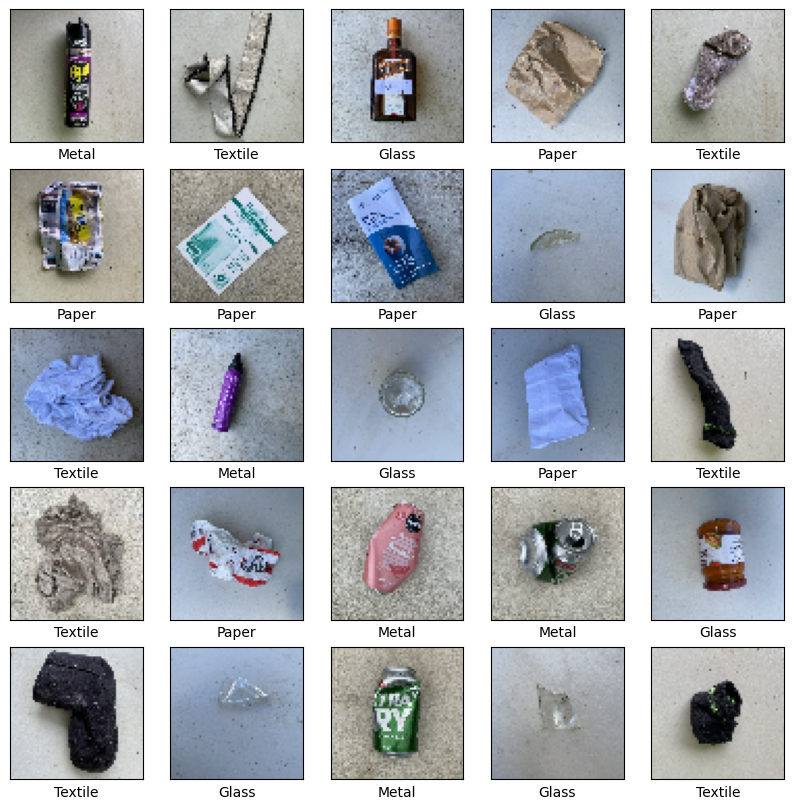

In [12]:
#Display 25 images 
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i])
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [13]:
#Sequential Model 1
# Experience 3 with Batch Normalisation
model_1 = tf.keras.models.Sequential([
    tf.keras.layers.Input((None,None,3)),
    resize_layer_32,
    
    # Block 1
    tf.keras.layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 2
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.25),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.05), activation = 'relu'),                                                      
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(4, activation='softmax')
       
])

model_1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (None, 32, 32, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 32, 32, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32, 32, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 544,708 (2.08 MB)

 Trainable params: 544,516 (2.08 MB)

 Non-trainable params: 192 (768.00 B)

## CNN custom Models 

In [14]:
#Sequential Model 2 
# With Batch Normalisation

model_2 = tf.keras.models.Sequential([
    tf.keras.layers.Input((64,64,3)),
    
    #Block 1
    tf.keras.layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block2
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block 3
    tf.keras.layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block 4
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
       
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(), 
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(4, activation='softmax')
       
])

model_2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 8, 8, 64)            │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 300,164 (1.15 MB)

 Trainable params: 299,460 (1.14 MB)

 Non-trainable params: 704 (2.75 KB)

In [15]:
#Sequential Model 3 
# Model 3 with batch normalisation

model_3 = tf.keras.models.Sequential([
    tf.keras.layers.Input((64,64,3)),
    
    # Block 1
    tf.keras.layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 2
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 3
    tf.keras.layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(), 
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 4
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block 5
    tf.keras.layers.Conv2D(32, (2,2), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation ='relu'),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(4, activation='softmax')      
])

model_3.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 8, 8, 64)            │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 8, 8, 64)            │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 4, 4, 32)            │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 2, 2, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 2, 2, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 193,444 (755.64 KB)

 Trainable params: 192,868 (753.39 KB)

 Non-trainable params: 576 (2.25 KB)

## Model checkpoint path for model 1 to 3 to monitor validation accuracy

In [16]:
# Add callbacks to save the model weight with best accuracy during training

#import ModelCheckpoint package
#from tensorflow.keras.callbacks import ModelCheckpoint
# Source: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint

checkpoint_filepath1 = 'C:/Mani/ModelCheckpoint/model1.keras'
model_checkpoint_callback1 = ModelCheckpoint(
    filepath=checkpoint_filepath1,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)


checkpoint_filepath2 = 'C:/Mani/ModelCheckpoint/model2.keras'
model_checkpoint_callback2 = ModelCheckpoint(
    filepath=checkpoint_filepath2,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

checkpoint_filepath3 = 'C:/Mani/ModelCheckpoint/model3.keras'
model_checkpoint_callback3 = ModelCheckpoint(
    filepath=checkpoint_filepath3,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

## Compile model 1 to 3 with optimum learning rate.

In [17]:
model_1.compile(optimizer = tf.keras.optimizers.Adam(0.0015),
                loss = 'sparse_categorical_crossentropy', 
                metrics=['accuracy'])


model_2.compile(optimizer = tf.keras.optimizers.Adam(0.001),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])


model_3.compile(optimizer = tf.keras.optimizers.Adam(0.00098),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])
               

## Setup learning rate scheduler

In [18]:
#Learning rate scheduler for Model 1 and 2

def scheduler1(epoch, lr):
    if epoch <= 30:
        return lr
    else:
        return lr * 0.95
        
    
lr_callback1 = LearningRateScheduler(scheduler1, verbose=1)

In [19]:
#Learning rate scheduler for Model 3

def scheduler2(epoch, lr):
    if epoch <= 45:
        return lr
    else:
        return lr * 0.95
        
    
lr_callback2 = LearningRateScheduler(scheduler2, verbose=1)

## Define the number of epochs and batch size

In [20]:
# Set number of epochs
epochs = 150
batch_size = 64

## Model fitting with validation split 20%

In [21]:
# Register the model training start time.
start_time = datetime.now()
print('Time model start:', start_time)

history1 = model_1.fit(train_images, train_labels,
                      batch_size=batch_size, epochs=epochs,
                      validation_split = 0.2, verbose=1,
                      callbacks=[lr_callback1, model_checkpoint_callback1])

# Register the model training end time.
end_time = datetime.now()
print('Time model end:', end_time)
print('Model_1_training_time', end_time - start_time)


Time model start: 2024-11-16 15:53:52.319792

Epoch 1: LearningRateScheduler setting learning rate to 0.001500000013038516.
Epoch 1/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.3753 - loss: 17.7043
Epoch 1: val_accuracy improved from -inf to 0.25000, saving model to C:/Mani/ModelCheckpoint/model1.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - accuracy: 0.3875 - loss: 17.4410 - val_accuracy: 0.2500 - val_loss: 12.2144 - learning_rate: 0.0015

Epoch 2: LearningRateScheduler setting learning rate to 0.001500000013038516.
Epoch 2/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.5917 - loss: 10.9695
Epoch 2: val_accuracy improved from 0.25000 to 0.28241, saving model to C:/Mani/ModelCheckpoint/model1.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - accuracy: 0.5932 - loss: 10.8487 - val_accuracy: 0.2824 - val_loss: 8.7174 - learning_rate: 0.0015

Epoch 3: LearningRateScheduler setting learning rate to 0.001500000013038516.
Epoch 3/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms

13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9750 - loss: 0.6839
Epoch 38: val_accuracy did not improve from 0.48148
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - accuracy: 0.9736 - loss: 0.6847 - val_accuracy: 0.2917 - val_loss: 2.7292 - learning_rate: 0.0010

Epoch 39: LearningRateScheduler setting learning rate to 0.0009951305866707117.
Epoch 39/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9644 - loss: 0.6513
Epoch 39: val_accuracy did not improve from 0.48148
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.9633 - loss: 0.6516 - val_accuracy: 0.3194 - val_loss: 2.2209 - learning_rate: 9.9513e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.0009453740960452705.
Epoch 40/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9463 - loss: 0.6435
Epoch 40: val_accuracy did not improve from 0.48148
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.9458 - loss: 0.6451 - val_accuracy: 0.4213 - val_loss: 1.8090 - learning_rate: 9.4537e-04

Epoch


Epoch 57: LearningRateScheduler setting learning rate to 0.00039528009365312754.
Epoch 57/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9801 - loss: 0.3216
Epoch 57: val_accuracy improved from 0.78704 to 0.82407, saving model to C:/Mani/ModelCheckpoint/model1.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - accuracy: 0.9813 - loss: 0.3194 - val_accuracy: 0.8241 - val_loss: 0.7056 - learning_rate: 3.9528e-04

Epoch 58: LearningRateScheduler setting learning rate to 0.0003755161000299267.
Epoch 58/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9932 - loss: 0.2910
Epoch 58: val_accuracy did not improve from 0.82407
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.9928 - loss: 0.2907 - val_accuracy: 0.7870 - val_loss: 0.7648 - learning_rate: 3.7552e-04

Epoch 59: LearningRateScheduler setting learning rate to 0.00035674029641086236.
Epoch 59/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.9924 - loss: 0.2774
Epoch 59: val_accuracy did not improve from 


Epoch 76: LearningRateScheduler setting learning rate to 0.00014916037034709006.
Epoch 76/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9986 - loss: 0.1959
Epoch 76: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.9984 - loss: 0.1965 - val_accuracy: 0.8056 - val_loss: 0.6136 - learning_rate: 1.4916e-04

Epoch 77: LearningRateScheduler setting learning rate to 0.00014170235735946334.
Epoch 77/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9999 - loss: 0.1969
Epoch 77: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - accuracy: 0.9998 - loss: 0.1973 - val_accuracy: 0.8194 - val_loss: 0.5919 - learning_rate: 1.4170e-04

Epoch 78: LearningRateScheduler setting learning rate to 0.0001346172415651381.
Epoch 78/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9962 - loss: 0.2006
Epoch 78: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - accuracy


Epoch 95: LearningRateScheduler setting learning rate to 5.628619710478233e-05.
Epoch 95/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9982 - loss: 0.1747
Epoch 95: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.9981 - loss: 0.1750 - val_accuracy: 0.8241 - val_loss: 0.5806 - learning_rate: 5.6286e-05

Epoch 96: LearningRateScheduler setting learning rate to 5.3471887076739216e-05.
Epoch 96/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9961 - loss: 0.1782
Epoch 96: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.9963 - loss: 0.1780 - val_accuracy: 0.8333 - val_loss: 0.5716 - learning_rate: 5.3472e-05

Epoch 97: LearningRateScheduler setting learning rate to 5.0798291340470314e-05.
Epoch 97/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9995 - loss: 0.1693
Epoch 97: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy


Epoch 114: LearningRateScheduler setting learning rate to 2.1239800207695226e-05.
Epoch 114/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9989 - loss: 0.1640
Epoch 114: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.9989 - loss: 0.1640 - val_accuracy: 0.8333 - val_loss: 0.5477 - learning_rate: 2.1240e-05

Epoch 115: LearningRateScheduler setting learning rate to 2.017781080212444e-05.
Epoch 115/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 1.0000 - loss: 0.1677
Epoch 115: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 1.0000 - loss: 0.1675 - val_accuracy: 0.8333 - val_loss: 0.5449 - learning_rate: 2.0178e-05

Epoch 116: LearningRateScheduler setting learning rate to 1.9168920607626203e-05.
Epoch 116/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9997 - loss: 0.1617
Epoch 116: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step -


Epoch 133: LearningRateScheduler setting learning rate to 8.014915329113137e-06.
Epoch 133/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9996 - loss: 0.1609
Epoch 133: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.9995 - loss: 0.1611 - val_accuracy: 0.8241 - val_loss: 0.5470 - learning_rate: 8.0149e-06

Epoch 134: LearningRateScheduler setting learning rate to 7.6141699082654665e-06.
Epoch 134/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9989 - loss: 0.1675
Epoch 134: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - accuracy: 0.9989 - loss: 0.1669 - val_accuracy: 0.8194 - val_loss: 0.5487 - learning_rate: 7.6142e-06

Epoch 135: LearningRateScheduler setting learning rate to 7.233461542455188e-06.
Epoch 135/150
13/14 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9980 - loss: 0.1606
Epoch 135: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - 

In [22]:
# Register the model training start time.
start_time = datetime.now()
print('Time model start:', start_time)


history2 = model_2.fit(train_images, train_labels,
                       batch_size=batch_size, epochs= epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[lr_callback1, model_checkpoint_callback2])


# Register the model training end time.
end_time = datetime.now()
print('Time model end:', end_time)
print('Model_2_training_time', end_time - start_time)


Time model start: 2024-11-16 15:56:11.201247

Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.4202 - loss: 6.0058
Epoch 1: val_accuracy improved from -inf to 0.26389, saving model to C:/Mani/ModelCheckpoint/model2.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 9s 325ms/step - accuracy: 0.4254 - loss: 5.9897 - val_accuracy: 0.2639 - val_loss: 5.7075 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step - accuracy: 0.6142 - loss: 5.2326
Epoch 2: val_accuracy did not improve from 0.26389
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 304ms/step - accuracy: 0.6142 - loss: 5.2307 - val_accuracy: 0.2639 - val_loss: 5.6332 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.6567 - loss: 4.9518
Epoch 3: val_ac


Epoch 20: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 20/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9356 - loss: 1.7626
Epoch 20: val_accuracy did not improve from 0.26389
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 288ms/step - accuracy: 0.9357 - loss: 1.7612 - val_accuracy: 0.2639 - val_loss: 5.9345 - learning_rate: 0.0010

Epoch 21: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 21/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9481 - loss: 1.6611
Epoch 21: val_accuracy did not improve from 0.26389
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 292ms/step - accuracy: 0.9476 - loss: 1.6606 - val_accuracy: 0.2639 - val_loss: 5.2686 - learning_rate: 0.0010

Epoch 22: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 22/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - accuracy: 0.9640 - loss: 1.5539
Epoch 22: val_accuracy did not improve from 0.26389
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 294ms/step - accuracy: 0.

Epoch 56/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9985 - loss: 0.4693
Epoch 56: val_accuracy improved from 0.79630 to 0.80556, saving model to C:/Mani/ModelCheckpoint/model2.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 285ms/step - accuracy: 0.9985 - loss: 0.4694 - val_accuracy: 0.8056 - val_loss: 0.9710 - learning_rate: 2.7739e-04

Epoch 57: LearningRateScheduler setting learning rate to 0.0002635200624354184.
Epoch 57/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9966 - loss: 0.4609
Epoch 57: val_accuracy did not improve from 0.80556
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 292ms/step - accuracy: 0.9965 - loss: 0.4609 - val_accuracy: 0.7639 - val_loss: 1.1034 - learning_rate: 2.6352e-04

Epoch 58: LearningRateScheduler setting learning rate to 0.0002503440482541919.
Epoch 58/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.9908 - loss: 0.4648
Epoch 58: val_accuracy did not improve from 0.80556
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 277ms/step - accuracy: 0.9909 - loss: 0.

14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 278ms/step - accuracy: 1.0000 - loss: 0.3684 - val_accuracy: 0.8380 - val_loss: 0.8459 - learning_rate: 1.1018e-04

Epoch 75: LearningRateScheduler setting learning rate to 0.00010467393149156123.
Epoch 75/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9998 - loss: 0.3628
Epoch 75: val_accuracy did not improve from 0.84722
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 280ms/step - accuracy: 0.9998 - loss: 0.3628 - val_accuracy: 0.8472 - val_loss: 0.8296 - learning_rate: 1.0467e-04

Epoch 76: LearningRateScheduler setting learning rate to 9.944023768184706e-05.
Epoch 76/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.9966 - loss: 0.3627
Epoch 76: val_accuracy improved from 0.84722 to 0.85185, saving model to C:/Mani/ModelCheckpoint/model2.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 284ms/step - accuracy: 0.9967 - loss: 0.3626 - val_accuracy: 0.8519 - val_loss: 0.8249 - learning_rate: 9.9440e-05

Epoch 77: LearningRateScheduler setting learning rate to 9.4468

Epoch 93/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 1.0000 - loss: 0.3249
Epoch 93: val_accuracy did not improve from 0.86574
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 277ms/step - accuracy: 1.0000 - loss: 0.3249 - val_accuracy: 0.8472 - val_loss: 0.8056 - learning_rate: 4.1578e-05

Epoch 94: LearningRateScheduler setting learning rate to 3.949908405047608e-05.
Epoch 94/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 1.0000 - loss: 0.3216
Epoch 94: val_accuracy did not improve from 0.86574
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 283ms/step - accuracy: 1.0000 - loss: 0.3216 - val_accuracy: 0.8426 - val_loss: 0.8174 - learning_rate: 3.9499e-05

Epoch 95: LearningRateScheduler setting learning rate to 3.752413140318822e-05.
Epoch 95/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 1.0000 - loss: 0.3216
Epoch 95: val_accuracy did not improve from 0.86574
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 277ms/step - accuracy: 1.0000 - loss: 0.3215 - val_accuracy: 0.8380 - val_loss: 0.8183 - learning_


Epoch 112: LearningRateScheduler setting learning rate to 1.568960378790507e-05.
Epoch 112/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 1.0000 - loss: 0.3074
Epoch 112: val_accuracy did not improve from 0.87037
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 283ms/step - accuracy: 1.0000 - loss: 0.3074 - val_accuracy: 0.8472 - val_loss: 0.8020 - learning_rate: 1.5690e-05

Epoch 113: LearningRateScheduler setting learning rate to 1.490512377131381e-05.
Epoch 113/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 1.0000 - loss: 0.3088
Epoch 113: val_accuracy did not improve from 0.87037
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 278ms/step - accuracy: 1.0000 - loss: 0.3088 - val_accuracy: 0.8426 - val_loss: 0.8012 - learning_rate: 1.4905e-05

Epoch 114: LearningRateScheduler setting learning rate to 1.4159867669150115e-05.
Epoch 114/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.9999 - loss: 0.3086
Epoch 114: val_accuracy did not improve from 0.87037
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 285ms/s


Epoch 131: LearningRateScheduler setting learning rate to 5.920527905800554e-06.
Epoch 131/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 1.0000 - loss: 0.3024
Epoch 131: val_accuracy did not improve from 0.87037
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 276ms/step - accuracy: 1.0000 - loss: 0.3024 - val_accuracy: 0.8472 - val_loss: 0.7910 - learning_rate: 5.9205e-06

Epoch 132: LearningRateScheduler setting learning rate to 5.624501704915019e-06.
Epoch 132/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 1.0000 - loss: 0.2997
Epoch 132: val_accuracy did not improve from 0.87037
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 277ms/step - accuracy: 1.0000 - loss: 0.2997 - val_accuracy: 0.8519 - val_loss: 0.7927 - learning_rate: 5.6245e-06

Epoch 133: LearningRateScheduler setting learning rate to 5.343276598068769e-06.
Epoch 133/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 1.0000 - loss: 0.3015
Epoch 133: val_accuracy did not improve from 0.87037
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/st


Epoch 150: LearningRateScheduler setting learning rate to 2.2341329326991397e-06.
Epoch 150/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 1.0000 - loss: 0.2985
Epoch 150: val_accuracy did not improve from 0.87037
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 277ms/step - accuracy: 1.0000 - loss: 0.2985 - val_accuracy: 0.8519 - val_loss: 0.7858 - learning_rate: 2.2341e-06
Time model end: 2024-11-16 16:06:11.562471
Model_2_training_time 0:10:00.361224


In [23]:
# Register the model training start time.
start_time = datetime.now()
print('Time model start:', start_time)

history3 = model_3.fit(train_images, train_labels,
                       batch_size=batch_size, epochs= epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[lr_callback2, model_checkpoint_callback3])


# Register the model training end time.
end_time = datetime.now()
print('Time model end:', end_time)
print('Model_3_training_time', end_time - start_time )

Time model start: 2024-11-16 16:06:11.571185

Epoch 1: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 1/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.3494 - loss: 14.9661
Epoch 1: val_accuracy improved from -inf to 0.36574, saving model to C:/Mani/ModelCheckpoint/model3.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 8s 314ms/step - accuracy: 0.3537 - loss: 14.9284 - val_accuracy: 0.3657 - val_loss: 13.4439 - learning_rate: 9.8000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 2/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - accuracy: 0.5230 - loss: 12.8666
Epoch 2: val_accuracy did not improve from 0.36574
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 280ms/step - accuracy: 0.5228 - loss: 12.8475 - val_accuracy: 0.2639 - val_loss: 12.0753 - learning_rate: 9.8000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 3/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.5888 - loss: 11.3015



Epoch 20: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 20/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - accuracy: 0.8813 - loss: 1.2355
Epoch 20: val_accuracy did not improve from 0.36574
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 308ms/step - accuracy: 0.8795 - loss: 1.2371 - val_accuracy: 0.2639 - val_loss: 4.2583 - learning_rate: 9.8000e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 21/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step - accuracy: 0.8174 - loss: 1.2692
Epoch 21: val_accuracy did not improve from 0.36574
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 301ms/step - accuracy: 0.8174 - loss: 1.2692 - val_accuracy: 0.2639 - val_loss: 5.4887 - learning_rate: 9.8000e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 22/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - accuracy: 0.8277 - loss: 1.2161
Epoch 22: val_accuracy did not improve from 0.36574
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 299ms/step - accu


Epoch 39: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 39/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step - accuracy: 0.9258 - loss: 0.7412
Epoch 39: val_accuracy did not improve from 0.48611
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 302ms/step - accuracy: 0.9249 - loss: 0.7426 - val_accuracy: 0.4769 - val_loss: 1.7150 - learning_rate: 9.8000e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 40/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9143 - loss: 0.7667
Epoch 40: val_accuracy did not improve from 0.48611
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 286ms/step - accuracy: 0.9135 - loss: 0.7689 - val_accuracy: 0.3148 - val_loss: 3.3599 - learning_rate: 9.8000e-04

Epoch 41: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 41/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - accuracy: 0.8982 - loss: 0.7901
Epoch 41: val_accuracy did not improve from 0.48611
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 280ms/step - accu

14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 287ms/step - accuracy: 0.9703 - loss: 0.5252 - val_accuracy: 0.6296 - val_loss: 1.5217 - learning_rate: 5.5742e-04

Epoch 58: LearningRateScheduler setting learning rate to 0.0005295528884744271.
Epoch 58/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 0.9809 - loss: 0.4867
Epoch 58: val_accuracy did not improve from 0.62963
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 278ms/step - accuracy: 0.9808 - loss: 0.4859 - val_accuracy: 0.5000 - val_loss: 1.8201 - learning_rate: 5.2955e-04

Epoch 59: LearningRateScheduler setting learning rate to 0.0005030752246966585.
Epoch 59/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9926 - loss: 0.4384
Epoch 59: val_accuracy did not improve from 0.62963
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - accuracy: 0.9924 - loss: 0.4383 - val_accuracy: 0.5648 - val_loss: 1.7790 - learning_rate: 5.0308e-04

Epoch 60: LearningRateScheduler setting learning rate to 0.00047792148834560063.
Epoch 60/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0

Epoch 76/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9894 - loss: 0.2812
Epoch 76: val_accuracy did not improve from 0.78241
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 280ms/step - accuracy: 0.9893 - loss: 0.2811 - val_accuracy: 0.7083 - val_loss: 1.0267 - learning_rate: 2.1035e-04

Epoch 77: LearningRateScheduler setting learning rate to 0.00019982864396297372.
Epoch 77/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9905 - loss: 0.2778
Epoch 77: val_accuracy did not improve from 0.78241
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - accuracy: 0.9907 - loss: 0.2775 - val_accuracy: 0.7778 - val_loss: 0.8594 - learning_rate: 1.9983e-04

Epoch 78: LearningRateScheduler setting learning rate to 0.00018983721383847296.
Epoch 78/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9934 - loss: 0.2653
Epoch 78: val_accuracy did not improve from 0.78241
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 280ms/step - accuracy: 0.9932 - loss: 0.2657 - val_accuracy: 0.7454 - val_loss: 1.0600 - learnin

14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 293ms/step - accuracy: 1.0000 - loss: 0.1895 - val_accuracy: 0.8241 - val_loss: 0.7128 - learning_rate: 8.3552e-05

Epoch 95: LearningRateScheduler setting learning rate to 7.937479786050972e-05.
Epoch 95/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.9965 - loss: 0.1943
Epoch 95: val_accuracy did not improve from 0.82870
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 282ms/step - accuracy: 0.9965 - loss: 0.1941 - val_accuracy: 0.8148 - val_loss: 0.7085 - learning_rate: 7.9375e-05

Epoch 96: LearningRateScheduler setting learning rate to 7.540605693066026e-05.
Epoch 96/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9991 - loss: 0.1871
Epoch 96: val_accuracy did not improve from 0.82870
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 289ms/step - accuracy: 0.9991 - loss: 0.1871 - val_accuracy: 0.8194 - val_loss: 0.7039 - learning_rate: 7.5406e-05

Epoch 97: LearningRateScheduler setting learning rate to 7.163575719459914e-05.
Epoch 97/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s


Epoch 132: LearningRateScheduler setting learning rate to 1.1897510012204293e-05.
Epoch 132/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 1.0000 - loss: 0.1530
Epoch 132: val_accuracy did not improve from 0.84259
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - accuracy: 1.0000 - loss: 0.1530 - val_accuracy: 0.8287 - val_loss: 0.7827 - learning_rate: 1.1898e-05

Epoch 133: LearningRateScheduler setting learning rate to 1.1302634857202064e-05.
Epoch 133/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 1.0000 - loss: 0.1509
Epoch 133: val_accuracy improved from 0.84259 to 0.84722, saving model to C:/Mani/ModelCheckpoint/model3.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 287ms/step - accuracy: 1.0000 - loss: 0.1508 - val_accuracy: 0.8472 - val_loss: 0.7625 - learning_rate: 1.1303e-05

Epoch 134: LearningRateScheduler setting learning rate to 1.0737502725532977e-05.
Epoch 134/150
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - accuracy: 1.0000 - loss: 0.1508
Epoch 134: val_accuracy improv

## Plot accuracy and loss against epochs during training and validation

Text(0.5, 1.0, 'Model 1 Accuracy (Exp:4.6)')

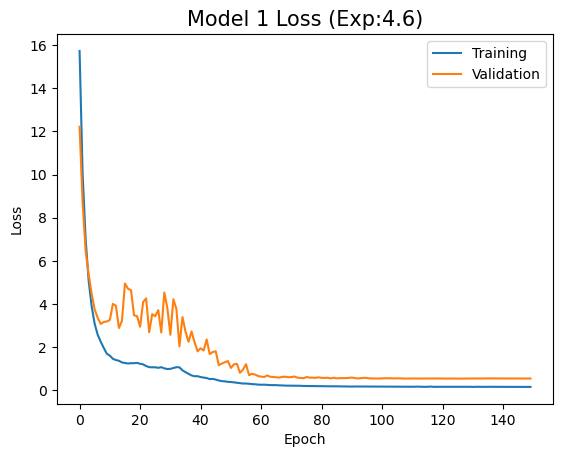

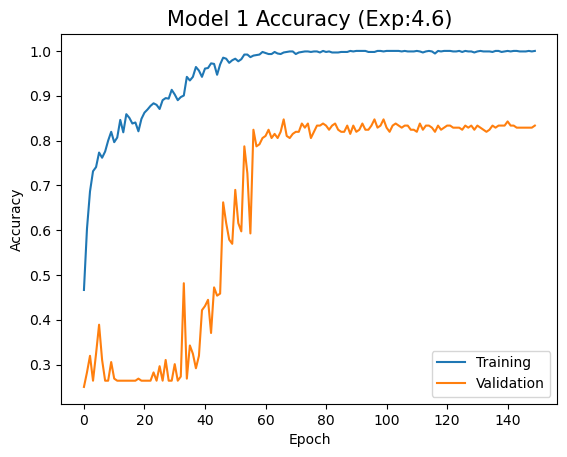

In [24]:

#Plot the training and validation loss
plt.figure()
plt.plot(history1.history['loss'], label='Training')
plt.plot(history1.history['val_loss'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Model 1 Loss (Exp:4.6)', fontsize = 15)

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history1.history['accuracy'], label='Training')
plt.plot(history1.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Model 1 Accuracy (Exp:4.6)', fontsize = 15)


Text(0.5, 1.0, 'Model 2 Accuracy (Exp:4.6)')

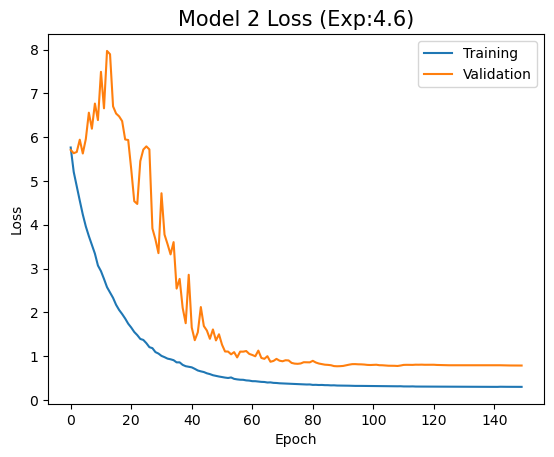

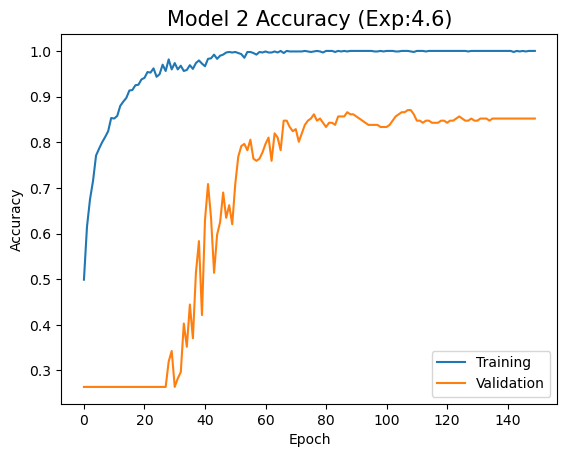

In [25]:
#Plot the training and validation loss
plt.figure()
plt.plot(history2.history['loss'], label='Training')
plt.plot(history2.history['val_loss'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Model 2 Loss (Exp:4.6)', fontsize = 15)

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history2.history['accuracy'], label='Training')
plt.plot(history2.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Model 2 Accuracy (Exp:4.6)', fontsize = 15)

Text(0.5, 1.0, 'Model 3 Accuracy (Exp:4.6)')

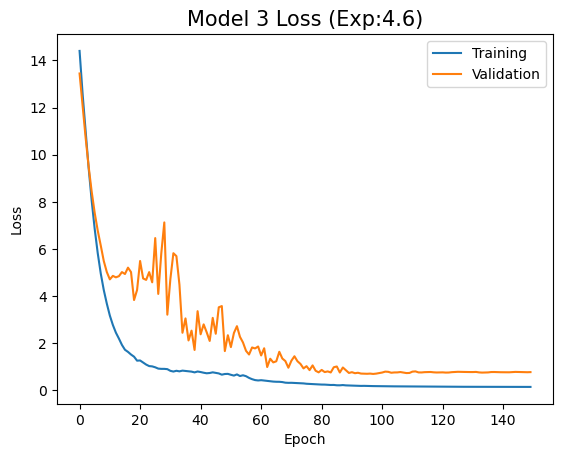

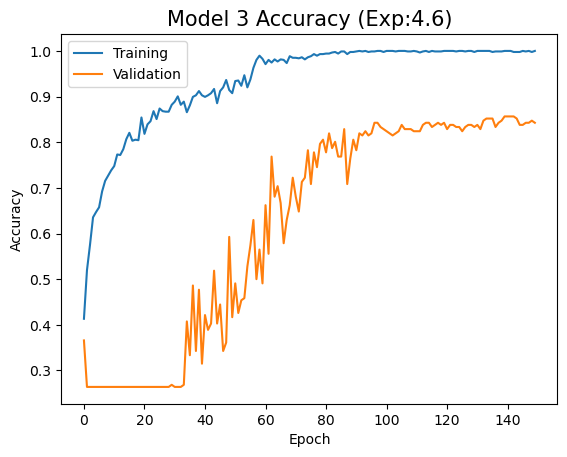

In [26]:
#Plot the training and validation loss
plt.figure()
plt.plot(history3.history['loss'], label='Training')
plt.plot(history3.history['val_loss'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Model 3 Loss (Exp:4.6)', fontsize = 15)

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history3.history['accuracy'], label='Training')
plt.plot(history3.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Model 3 Accuracy (Exp:4.6)', fontsize = 15)

## Evaluate the model for test images

In [27]:
# Evaluate the test result for model 1, 2, 3
#model_1.load_weights(checkpoint_filepath1)
Test_result1 = model_1.evaluate(test_images, test_labels, batch_size = 64)

#model_2.load_weights(checkpoint_filepath2)
Test_result2 = model_2.evaluate(test_images, test_labels, batch_size = 64)

#model_3.load_weights(checkpoint_filepath3)
Test_result3 = model_3.evaluate(test_images, test_labels, batch_size = 64)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8369 - loss: 0.5266
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.8754 - loss: 0.6559
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.8572 - loss: 0.5482


## Confusion matrix for model 1 to 3

In [28]:
predictions1 = model_1.predict(test_images)     # Vector of probabilities
pred_label1 = np.argmax(predictions1, axis = 1) # We take the highest probability


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


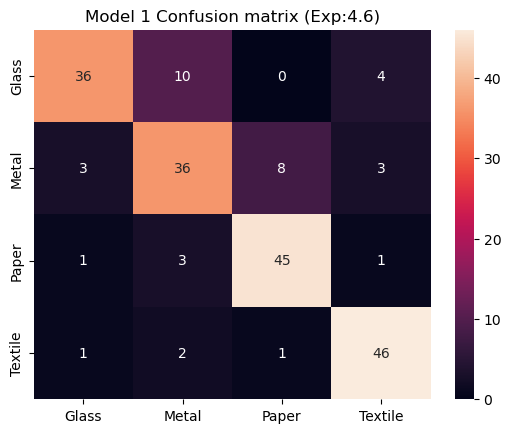

In [29]:
CM1 = confusion_matrix(test_labels, pred_label1)
ax = plt.axes()
sns.heatmap(CM1, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Model 1 Confusion matrix (Exp:4.6)')
plt.show()

In [30]:
#Obtain the model's prediction for the test_images
predictions2 = model_2.predict(test_images)
pred_label2 = np.argmax(predictions2, axis = 1)



7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


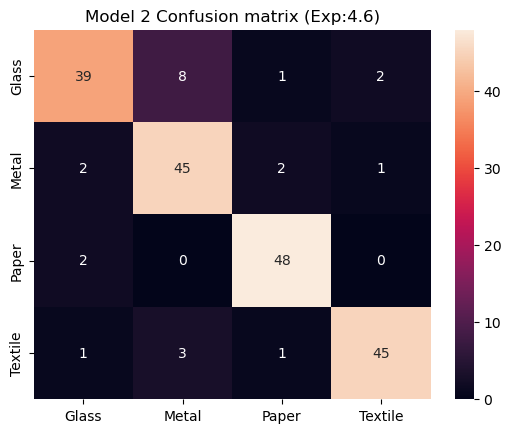

In [31]:
CM2 = confusion_matrix(test_labels, pred_label2)
ax = plt.axes()
sns.heatmap(CM2, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Model 2 Confusion matrix (Exp:4.6)')
plt.show()

In [32]:
#Obtain the model's prediction for the test_images
predictions3 = model_3.predict(test_images)
pred_label3 = np.argmax(predictions3, axis = 1)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


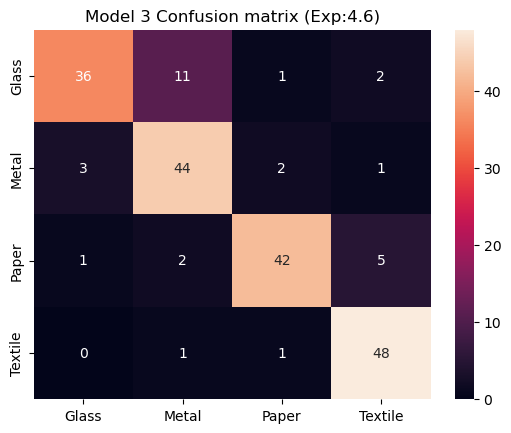

In [33]:
CM3 = confusion_matrix(test_labels, pred_label3)
ax = plt.axes()
sns.heatmap(CM3, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Model 3 Confusion matrix (Exp:4.6)')
plt.show()

## Display 25 images for each model with actual and predicted label

25 random image with actual and predicted label for Model 1


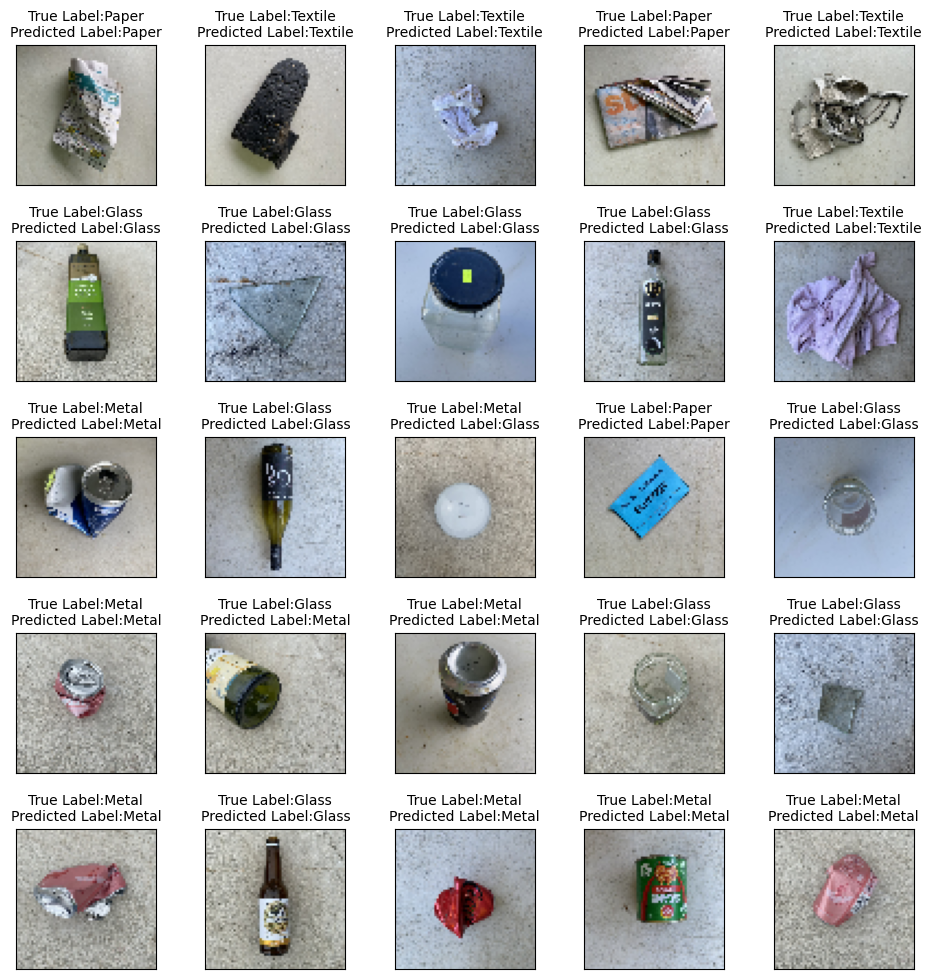

In [34]:
#Display actual and predicted labels for 25 images model 3
print('25 random image with actual and predicted label for Model 1')
fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace = 0.4, wspace = 0.1)

for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.grid(False)
    plt.imshow(test_images[i])
    plt.title("True Label:" + class_names[test_labels[i]] +"\n"+"Predicted Label:"
              + class_names[pred_label1[i]], fontsize = 10)
    
    
    #plt.show()

25 random image with actual and predicted label for Model 2


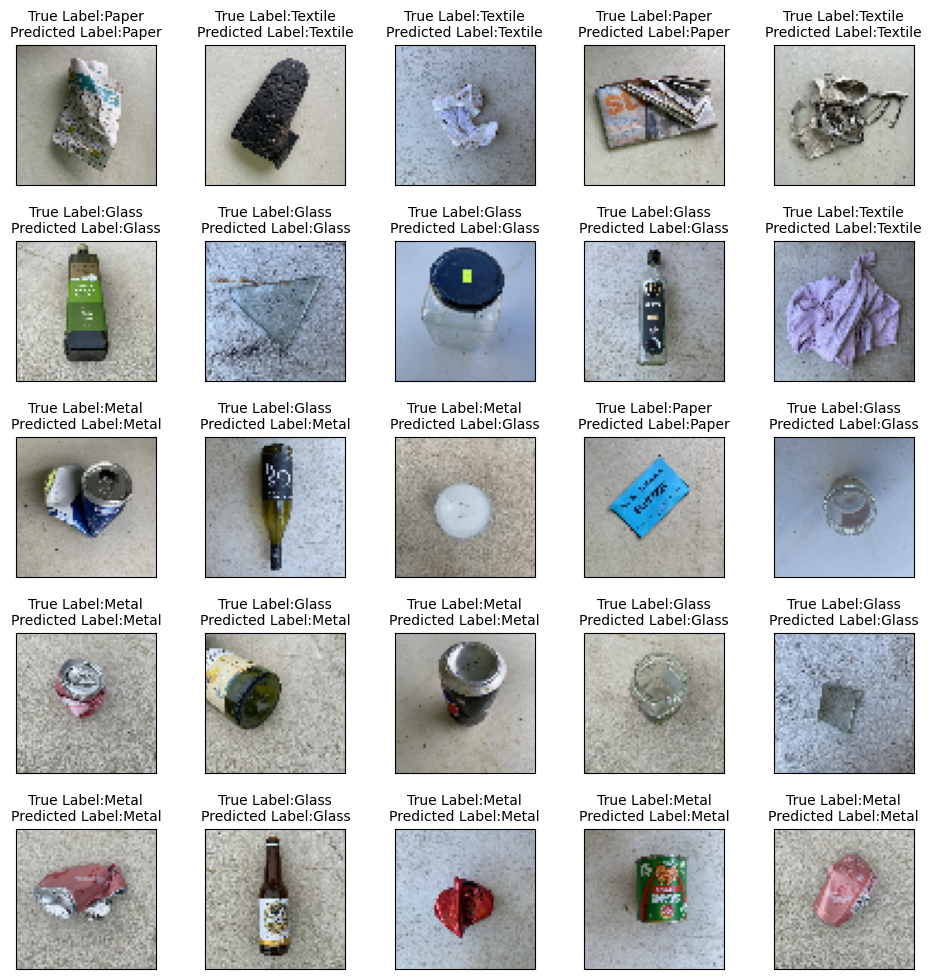

In [35]:
#Display actual and predicted labels for 25 images 
print('25 random image with actual and predicted label for Model 2')
fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace = 0.4, wspace = 0.1)

for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.grid(False)
    plt.imshow(test_images[i])
    plt.title("True Label:" + class_names[test_labels[i]] +"\n"+"Predicted Label:"
              + class_names[pred_label2[i]], fontsize = 10)
    

25 random image with actual and predicted label for Model 3


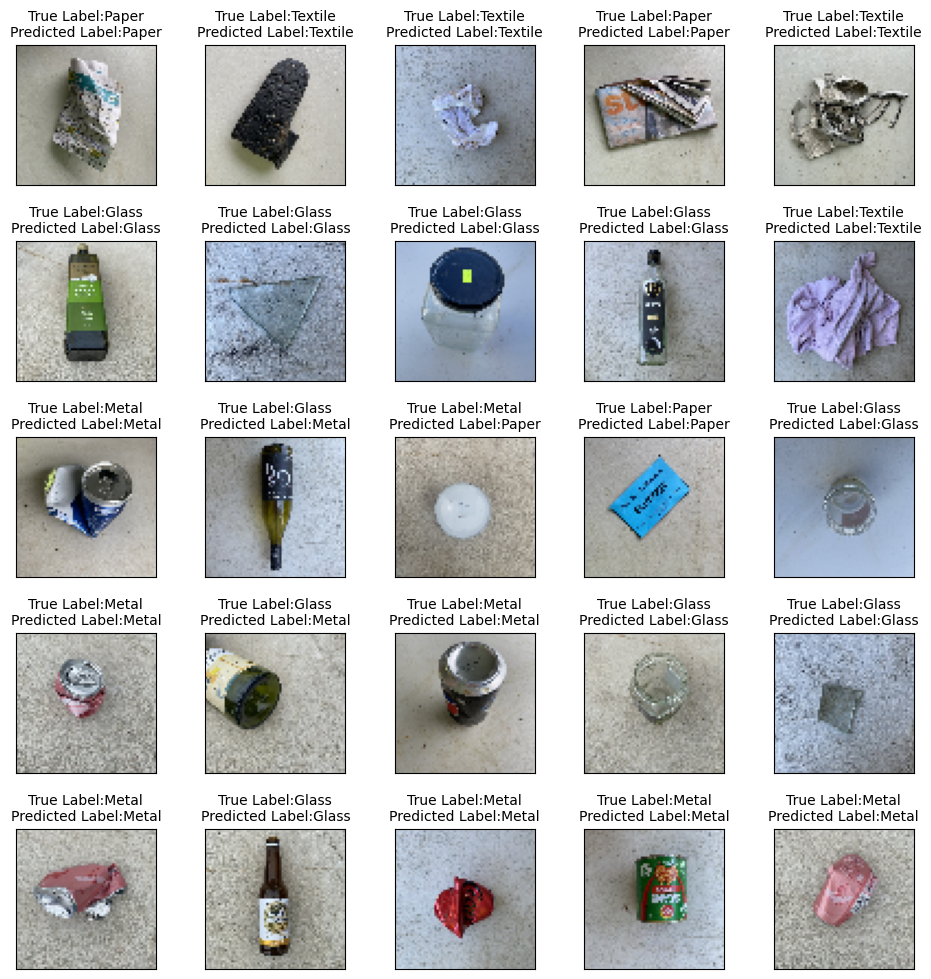

In [36]:
#Display actual and predicted labels for 25 images 
print('25 random image with actual and predicted label for Model 3')
fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace = 0.4, wspace = 0.1)

for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.grid(False)
    plt.imshow(test_images[i])
    plt.title("True Label:" + class_names[test_labels[i]] +"\n"+"Predicted Label:"
              + class_names[pred_label3[i]], fontsize = 10)
    

## Display the misclassied image for model 1 to 3

In [37]:
def display_mislabel_images(class_names, images, labels):
    """
        Display mislabel images from the images array with its corresponding labels
    """
  
    fig = plt.figure(figsize=(15,15))
    #fig.suptitle("mislabeled images", fontsize=16)
    for i in range(20):
        plt.subplot(6,6,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i], cmap=plt.cm.binary)
        plt.xlabel(class_names[labels[i]], fontsize = 15) 
    plt.show()

In [38]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    """
        Print all the mislabeled images by the classifier
    """
    correct_label = (test_labels == pred_labels)
    mislabeled_indices = np.where(correct_label == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
         
    display_mislabel_images(class_names,  mislabeled_images, mislabeled_labels)

Mislabel images for model 1


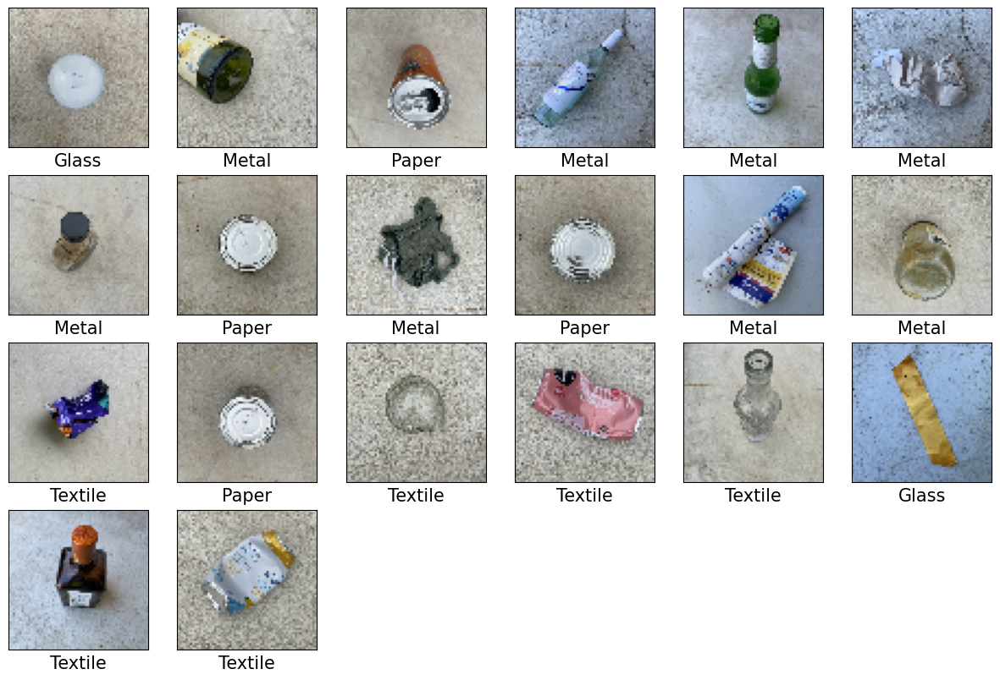

In [39]:
print('Mislabel images for model 1')
print_mislabeled_images(class_names, test_images, test_labels, pred_label1)

Mislabel images for model 2


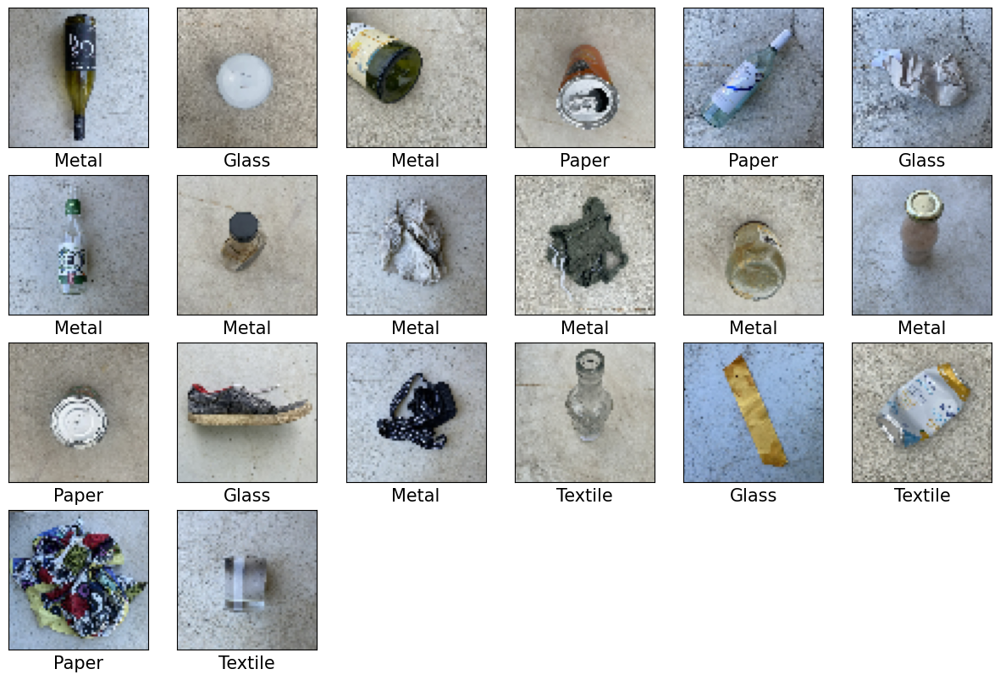

In [40]:
print('Mislabel images for model 2')
print_mislabeled_images(class_names, test_images, test_labels, pred_label2)

Mislabel images for model 3


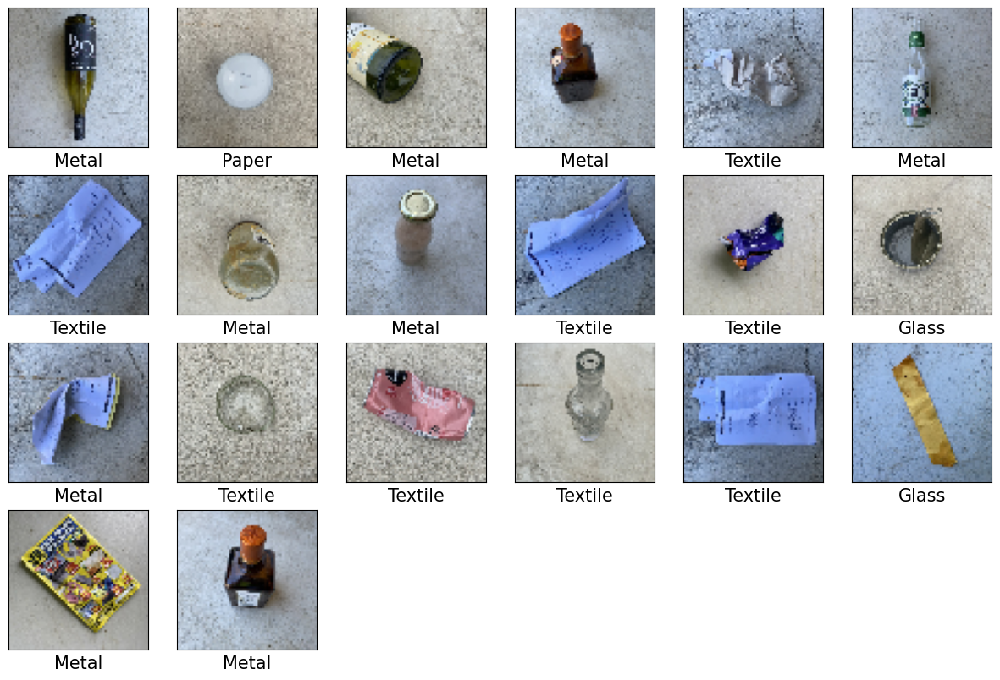

In [41]:
print('Mislabel images for model 3')
print_mislabeled_images(class_names, test_images, test_labels, pred_label3)

## Predict a single image

Predict start: 2024-11-16 16:16:32.204441


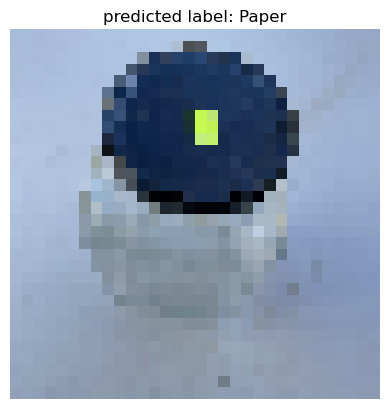

Predict end: 2024-11-16 16:16:32.355598
Prediction time: 0:00:00.151157


In [42]:
start_time = datetime.now()
print('Predict start:', start_time)

IMAGE_SIZE = (32, 32)
test_image1 = cv2.imread("C:/test_ds/Glass/Glass_82.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_1(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
print('Predict end:', end_time)
print('Prediction time:', end_time - start_time)

Predict start: 2024-11-16 16:16:32.363986


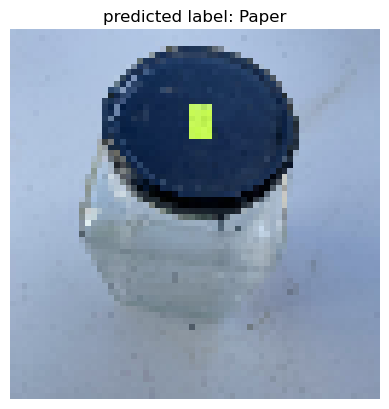

Predict end: 2024-11-16 16:16:32.502255
Prediction time: 0:00:00.138269


In [43]:
start_time = datetime.now()
print('Predict start:', start_time)

IMAGE_SIZE = (64, 64)
test_image1 = cv2.imread("C:/test_ds/Glass/Glass_82.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_2(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
print('Predict end:', end_time)
print('Prediction time:', end_time - start_time)

Predict start: 2024-11-16 16:16:32.512424


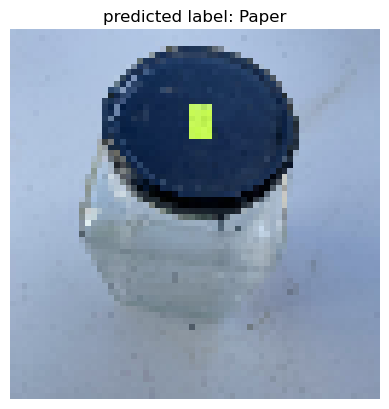

Predict end: 2024-11-16 16:16:32.635809
Prediction time: 0:00:00.123385


In [44]:
start_time = datetime.now()
print('Predict start:', start_time)

IMAGE_SIZE = (64, 64)
test_image1 = cv2.imread("C:/test_ds/Glass/Glass_82.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_3(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
print('Predict end:', end_time)
print('Prediction time:', end_time - start_time)

## Pre-Training model - Transfer Learning

In [45]:
#Class labelsb
class_names = ['Glass', 'Metal', 'Paper', 'Textile']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}
nb_classes = len(class_names)
IMAGE_SIZE = (224, 224)

In [46]:
#Prepare dataset for training and testing for Resnet50
(train_images1, train_labels1), (test_images1, test_labels1) = load_data(train_ds_1, test_ds_1)


Loading C:/Mani/Dataset/dataset1/train_ds


100%|███████████████████████████████████████████████████████████████████████████████| 270/270 [00:01<00:00, 150.77it/s]


Loading C:/Mani/Dataset/dataset1/test_ds


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.67it/s]


In [47]:
# Shuffle only the training dataset
np.random.seed(321)
train_images1, train_labels1 = shuffle(train_images1, train_labels1)
test_images1, test_labels1 = shuffle(test_images1, test_labels1)

In [48]:
#Check the training and testing image shape - should 224 by 224 for Resnet50
train_images1.shape, test_images1.shape

((1080, 224, 224, 3), (200, 224, 224, 3))

In [49]:
#Normalise train and test image dataset from 0,255 to 0,1
train_images_scaled = train_images1 / 255.0 
test_images_scaled = test_images1 / 255.0

In [50]:
# Add callbacks to save the model weight with best accuracy during training
# import ModelCheckpoint package
# from tensorflow.keras.callbacks import ModelCheckpoint
# Source: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint

checkpoint_filepath4 = 'C:/Mani/ModelCheckpoint/model4.keras'
model_checkpoint_callback4 = ModelCheckpoint(
    filepath=checkpoint_filepath4,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)


checkpoint_filepath5 = 'C:/Mani/ModelCheckpoint/model5.keras'
model_checkpoint_callback5 = ModelCheckpoint(
    filepath=checkpoint_filepath5,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)



## Pre-Trained Model - EfficientNetV2L

In [51]:
#EfficientNet pre-trained model
base_model = tf.keras.applications.EfficientNetV2L(
    include_top=False,
    weights='imagenet',
    input_shape=((224,224,3)),
    )


In [52]:
base_model.trainable = False

In [53]:
# Build EfficientNetV2 model for waste classification

model_EfficientNetV2 = tf.keras.Sequential([
    tf.keras.layers.Input((224,224,3)),
    base_model,
    tf.keras.layers.Conv2D(32, (3,3),padding='same', kernel_regularizer=regularizers.l2(0.05), activation='relu'),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Flatten(),
    #tf.keras.layers.Dense(1024, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(4, activation='softmax')      
])

model_EfficientNetV2.summary()    


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetv2-l (Functional)        │ (None, 7, 7, 1280)          │     117,746,848 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 7, 7, 32)            │         368,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 3, 3, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 3, 3, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 288)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │          36,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 118,153,028 (450.72 MB)

 Trainable params: 406,180 (1.55 MB)

 Non-trainable params: 117,746,848 (449.17 MB)

In [54]:
#Compile Efficientnet model

base_learning_rate = 0.0005
model_EfficientNetV2.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])



## Fit EfficientNet 

In [55]:
epochs = 40
# Get the current time
start_time = datetime.now()
print('Time model start:', start_time)

history4 = model_EfficientNetV2.fit(train_images1, train_labels1,
                       batch_size=batch_size, epochs= epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[model_checkpoint_callback4
                                 ])

# Get the current time
end_time = datetime.now()
print('Time model end:', end_time) 

Time model start: 2024-11-16 16:16:54.954099
Epoch 1/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.5125 - loss: 106.2118 
Epoch 1: val_accuracy improved from -inf to 0.87037, saving model to C:/Mani/ModelCheckpoint/model4.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 277s 16s/step - accuracy: 0.5215 - loss: 105.9405 - val_accuracy: 0.8704 - val_loss: 92.2780
Epoch 2/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.8506 - loss: 88.5757 
Epoch 2: val_accuracy improved from 0.87037 to 0.89352, saving model to C:/Mani/ModelCheckpoint/model4.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 202s 15s/step - accuracy: 0.8516 - loss: 88.3502 - val_accuracy: 0.8935 - val_loss: 76.8814
Epoch 3/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.8996 - loss: 73.6627 
Epoch 3: val_accuracy improved from 0.89352 to 0.89815, saving model to C:/Mani/ModelCheckpoint/model4.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 199s 14s/step - accuracy: 0.8994 - loss: 73.4721 - val_accuracy: 0.8981 - val_loss: 63.7514
Epoch 4/40
14/

Text(0.5, 1.0, 'EfficientNet Model Accuracy (Exp:6.1)')

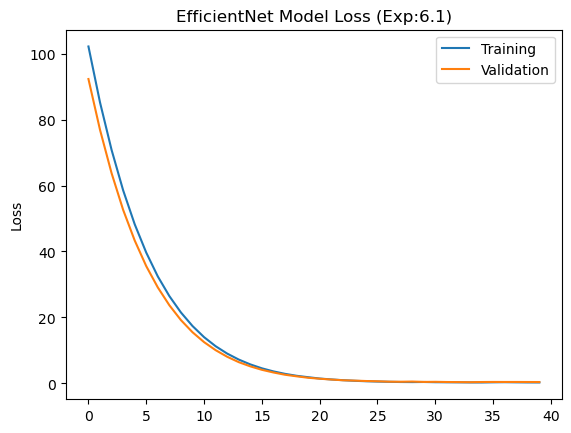

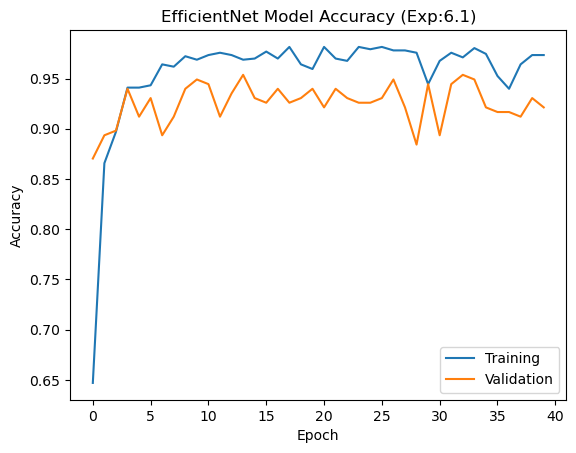

In [56]:
#Plot the training and validation loss
plt.figure()
plt.plot(history4.history['loss'], label='Training')
plt.plot(history4.history['val_loss'], label='Validation')
plt.legend(loc=0)

plt.ylabel('Loss')
plt.title('EfficientNet Model Loss (Exp:6.1)')

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history4.history['accuracy'], label='Training')
plt.plot(history4.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('EfficientNet Model Accuracy (Exp:6.1)')

In [57]:
# Evaluate the test result EfficientNet
#model_1.load_weights(checkpoint_filepath4)
Test_result4 = model_EfficientNetV2.evaluate(test_images1, test_labels1, batch_size = 64)

4/4 ━━━━━━━━━━━━━━━━━━━━ 37s 8s/step - accuracy: 0.9508 - loss: 0.3626


In [58]:
# Reference tf.keras.applications.ResNet50 - tensorflow > API > Tensorflow v2.16.1 > Python
#Load the best model1 weight from checkpoint
#model_EfficientNetV2.load_weights(checkpoint_filepath4)

#Obtain the model's prediction for the test_images
prediction4 = model_EfficientNetV2.predict(test_images1)

pred_label4 = np.argmax(prediction4, axis = 1)

7/7 ━━━━━━━━━━━━━━━━━━━━ 62s 7s/step


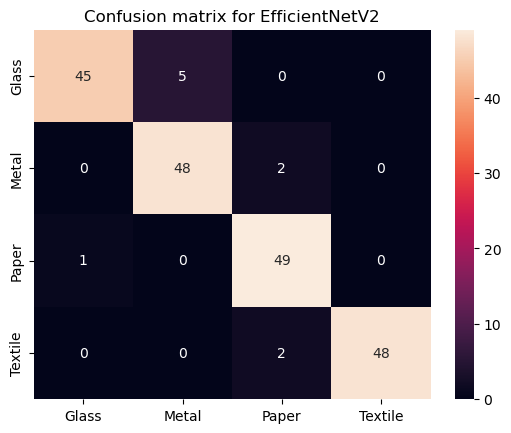

In [59]:
CM4 = confusion_matrix(test_labels1, pred_label4)
ax = plt.axes()
sns.heatmap(CM4, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Confusion matrix for EfficientNetV2')
plt.show()


## Pre-Train model - MobileNetV3Large

In [60]:
#base_model_MobileNetV3Large

base_model_MobileNetV3 = tf.keras.applications.MobileNetV3Large(
    include_top=False,
    weights='imagenet',
    input_shape=((224,224,3)),
    )

base_model_MobileNetV3.trainable = False

# Build MobileNetV3 model for waste classification

model_MobileNetV3 = tf.keras.Sequential([
    tf.keras.layers.Input((224,224,3)),
    base_model_MobileNetV3,
    tf.keras.layers.Conv2D(128, (3,3),padding='same', kernel_regularizer=regularizers.l2(0.05), activation='relu'),
    tf.keras.layers.MaxPooling2D((2,2)),
    #tf.keras.layer.GlobalMaxPool2D((2,2))
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Flatten(),
    #tf.keras.layers.Dense(1024, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(4, activation='softmax')      
])

model_MobileNetV3.summary()  

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobilenetV3large (Functional)        │ (None, 7, 7, 960)           │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 7, 7, 128)           │       1,106,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 3, 3, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 3, 3, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,251,012 (16.22 MB)

 Trainable params: 1,254,404 (4.79 MB)

 Non-trainable params: 2,996,608 (11.43 MB)

In [61]:
#Compile and fit MobileNet model

Mobile_learning_rate = 0.0002
M_epochs = 40

model_MobileNetV3.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = Mobile_learning_rate),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])


# Get the current time
start_time = datetime.now()
print('Time training start:', start_time)

history5 = model_MobileNetV3.fit(train_images1, train_labels1,
                       batch_size=batch_size, epochs= M_epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[model_checkpoint_callback5])

# Get the current time
end_time = datetime.now()
print('Time training end:', end_time)


Time training start: 2024-11-16 18:36:27.865793
Epoch 1/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3978 - loss: 147.6094
Epoch 1: val_accuracy improved from -inf to 0.75926, saving model to C:/Mani/ModelCheckpoint/model5.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step - accuracy: 0.4052 - loss: 147.3598 - val_accuracy: 0.7593 - val_loss: 134.7626
Epoch 2/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8232 - loss: 130.9016
Epoch 2: val_accuracy improved from 0.75926 to 0.84259, saving model to C:/Mani/ModelCheckpoint/model5.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - accuracy: 0.8244 - loss: 130.6851 - val_accuracy: 0.8426 - val_loss: 119.7338
Epoch 3/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 963ms/step - accuracy: 0.9103 - loss: 116.2059
Epoch 3: val_accuracy improved from 0.84259 to 0.85648, saving model to C:/Mani/ModelCheckpoint/model5.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.9107 - loss: 116.0071 - val_accuracy: 0.8565 - val_loss: 106.0304
Epoch 4/40
14

Epoch 25/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 954ms/step - accuracy: 1.0000 - loss: 5.1381
Epoch 25: val_accuracy did not improve from 0.89815
14/14 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 1.0000 - loss: 5.1266 - val_accuracy: 0.8657 - val_loss: 5.0341
Epoch 26/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 978ms/step - accuracy: 1.0000 - loss: 4.3739
Epoch 26: val_accuracy did not improve from 0.89815
14/14 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 1.0000 - loss: 4.3640 - val_accuracy: 0.8611 - val_loss: 4.3807
Epoch 27/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 1.0000 - loss: 3.7204
Epoch 27: val_accuracy did not improve from 0.89815
14/14 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 1.0000 - loss: 3.7118 - val_accuracy: 0.8750 - val_loss: 3.8111
Epoch 28/40
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 928ms/step - accuracy: 1.0000 - loss: 3.1567
Epoch 28: val_accuracy did not improve from 0.89815
14/14 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 1.0000 - loss: 3.1494 - val_accuracy: 0.8796 - val_

Text(0.5, 1.0, 'MobileNet Model Accuracy (Exp:6.1)')

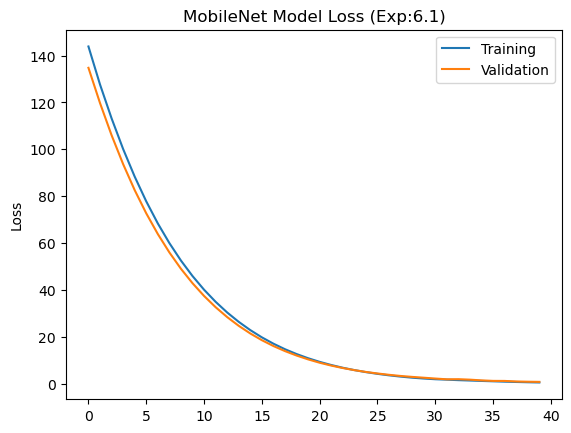

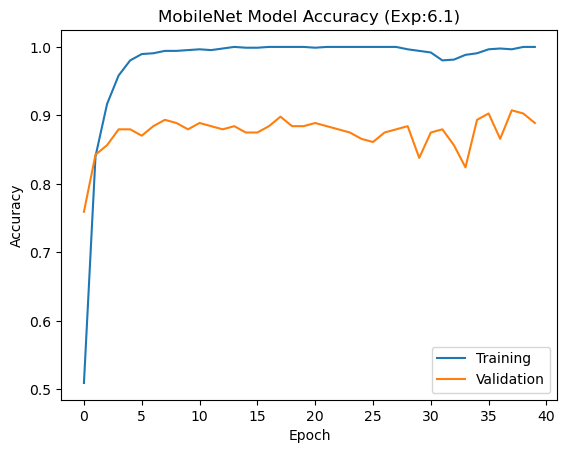

In [62]:
#Plot the training and validation loss
plt.figure()
plt.plot(history5.history['loss'], label='Training')
plt.plot(history5.history['val_loss'], label='Validation')
plt.legend(loc=0)

plt.ylabel('Loss')
plt.title('MobileNet Model Loss (Exp:6.1)')

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history5.history['accuracy'], label='Training')
plt.plot(history5.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('MobileNet Model Accuracy (Exp:6.1)')

In [63]:
#Load the best model1 weight from checkpoint
#model_MobileNetV3.load_weights(checkpoint_filepath5)
MobileNetV3_result = model_MobileNetV3.evaluate(test_images1, test_labels1)

print('MobileNetV3 accuracy:', MobileNetV3_result)

7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 460ms/step - accuracy: 0.9408 - loss: 0.7152
MobileNetV3 accuracy: [0.724094033241272, 0.9350000023841858]


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 751ms/step


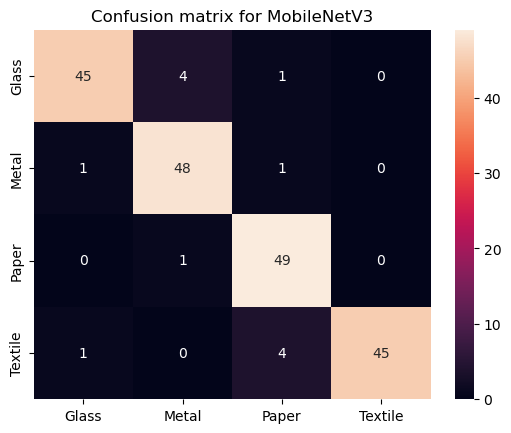

In [64]:
# Reference tf.keras.applications.MobileNetV3 - tensorflow > API > Tensorflow v2.16.1 > Python
#Load the best model weight from checkpoint
#model_MobileNetV3.load_weights(checkpoint_filepath5)

#Obtain the model's prediction for the test_images
prediction5 = model_MobileNetV3.predict(test_images1)

pred_label5 = np.argmax(prediction5, axis = 1)

CM5 = confusion_matrix(test_labels1, pred_label5)
ax = plt.axes()
sns.heatmap(CM5, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Confusion matrix for MobileNetV3')
plt.show()


In [70]:
def display_mislabel_images(class_names, images, labels):
    """
        Display mislabel images from the images array with its corresponding labels
    """
    
    fig = plt.figure(figsize=(10,10))
    fig.suptitle("mislabeled images", fontsize=16)
    for i in range(13):
        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i]/255., cmap=plt.cm.binary)
        plt.xlabel(class_names[labels[i]], fontsize = 15)
        
    plt.show()

In [66]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    """
        Print all the mislabeled images by the classifier
    """
    correct_label = (test_labels == pred_labels)
    mislabeled_indices = np.where(correct_label == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
    actual_label = test_labels[mislabeled_indices]

      
    display_mislabel_images(class_names,  mislabeled_images, mislabeled_labels)

EfficientNetV2


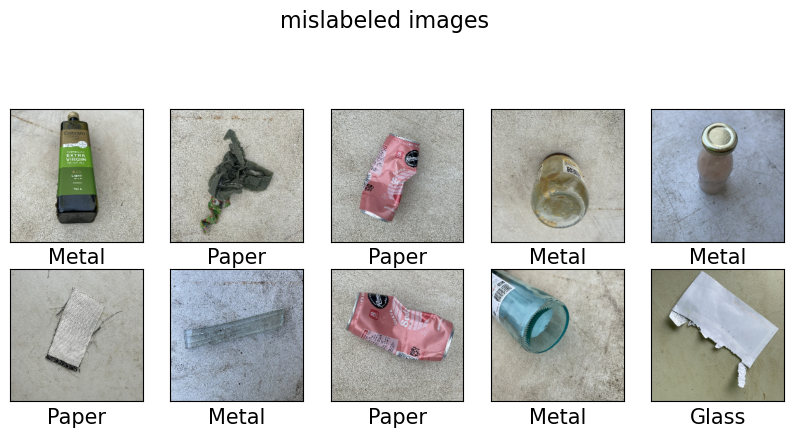

In [69]:
print('EfficientNetV2')
print_mislabeled_images(class_names, test_images1, test_labels1, pred_label4)

MobileNetV3


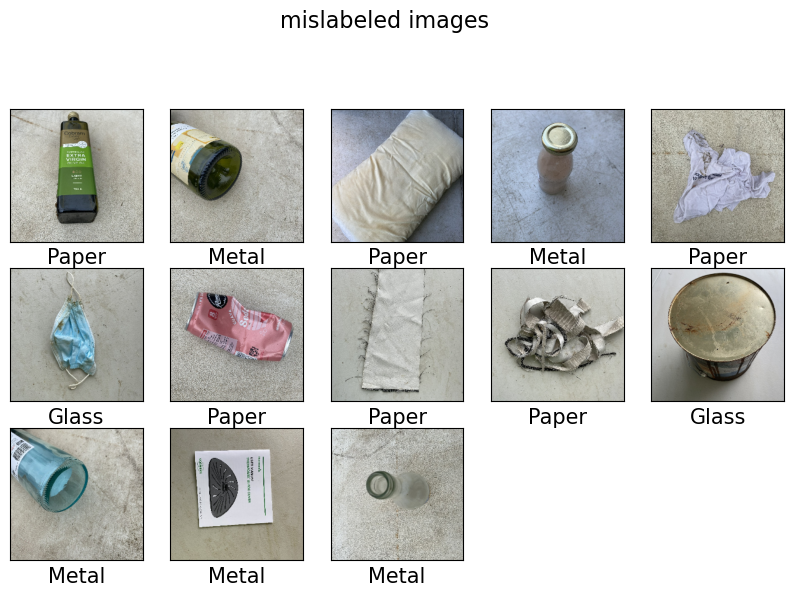

In [71]:
print('MobileNetV3')
print_mislabeled_images(class_names, test_images1, test_labels1, pred_label5)

## Predict Single images for mobileNet and EfficientNet

Time training start: 2024-11-16 18:55:31.993443


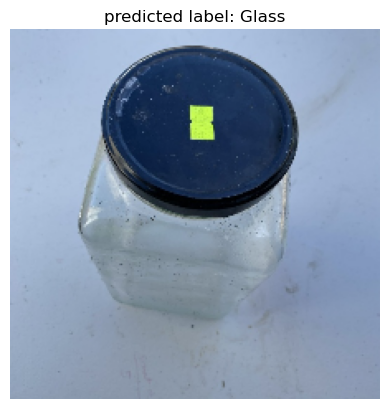

Time training end: 2024-11-16 18:55:32.595074
MobileNet Prediction time: 0:00:00.601631


In [72]:
start_time = datetime.now()
print('Time training start:', start_time)

IMAGE_SIZE = (224, 224)
test_image1 = cv2.imread("C:/test_ds/Glass/Glass_82.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_MobileNetV3(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
print('Time training end:', end_time)
print('MobileNet Prediction time:', end_time - start_time)

Time training start: 2024-11-16 18:55:35.615349


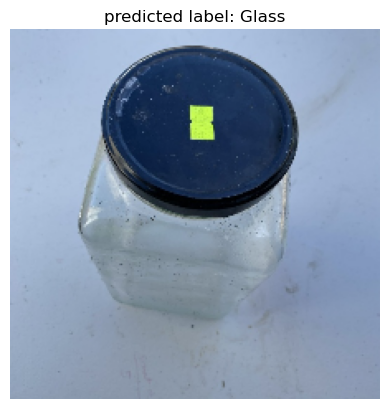

Time training end: 2024-11-16 18:55:37.883479
EfficientNet Prediction time : 0:00:02.268130


In [73]:
start_time = datetime.now()
print('Time training start:', start_time)

IMAGE_SIZE = (224, 224)
test_image1 = cv2.imread("C:/test_ds/Glass/Glass_82.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_EfficientNetV2(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
print('Time training end:', end_time)
print('EfficientNet Prediction time :', end_time - start_time)